# Zero DCE 

Zero reference deep curve estimation for low light enhancement 

In [61]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (8,6)

In [62]:
img = cv2.imread("LOL-v2/Train/Low/img42.png")

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img = img.astype(np.float32) / 255.0

print(img.shape)

(384, 384, 3)


In [63]:
img

array([[[0.01568628, 0.01960784, 0.01568628],
        [0.01568628, 0.01568628, 0.01568628],
        [0.02352941, 0.02352941, 0.01568628],
        ...,
        [0.00392157, 0.00392157, 0.00392157],
        [0.00784314, 0.00784314, 0.00392157],
        [0.01176471, 0.00784314, 0.00784314]],

       [[0.01960784, 0.02352941, 0.01568628],
        [0.01568628, 0.01568628, 0.01176471],
        [0.01960784, 0.01960784, 0.01568628],
        ...,
        [0.00784314, 0.00784314, 0.00784314],
        [0.01176471, 0.01176471, 0.01176471],
        [0.01568628, 0.01176471, 0.01176471]],

       [[0.04313726, 0.05098039, 0.02745098],
        [0.03529412, 0.03921569, 0.01960784],
        [0.01176471, 0.00784314, 0.00392157],
        ...,
        [0.01176471, 0.01176471, 0.01176471],
        [0.00784314, 0.00784314, 0.00784314],
        [0.01176471, 0.01176471, 0.01176471]],

       ...,

       [[0.10980392, 0.10588235, 0.09803922],
        [0.10980392, 0.10588235, 0.09019608],
        [0.11372549, 0

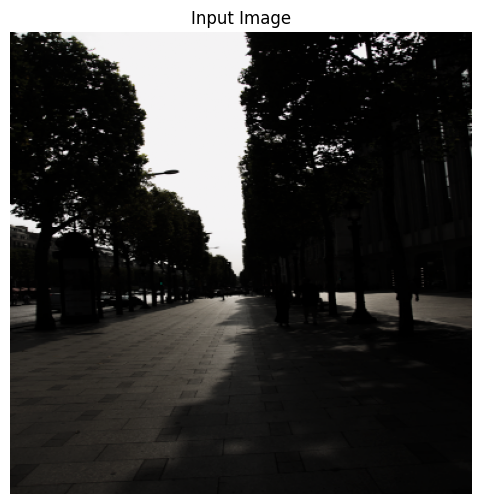

In [64]:
plt.imshow(img)
plt.title("Input Image")
plt.axis("off")
plt.show()

# Methodology 

A Deep Curve Estimation Network (DCE-Net) is devised to estimate a set of best-fitting Light-Enhancement curves (LE-curves) given an input image.

# Light-Enhancement Curve (LE-curve) 

LE(I(x),alpha) = I(x) + alpha*I(x)(1 - I(x)) 

high order curve :

LE_n(x) = LE_n-1(x) + alpha * LE_n-1(x)(1 - LE_n-1(x)) 

n = 8

we formulate αas a pixel-wise parameter, i.e., each pixel of the given input image has a corresponding curve with the best-fitting αto adjust its dynamic range.

LE_n(x) = LE_n-1(x) + A_n * LE_n-1(x)(1 - LE_n-1(x)) 

A_n : parameter map with the same size as the given image

In [65]:
def enhance_curve(image, alpha):
    return image + alpha * image * (1 - image)

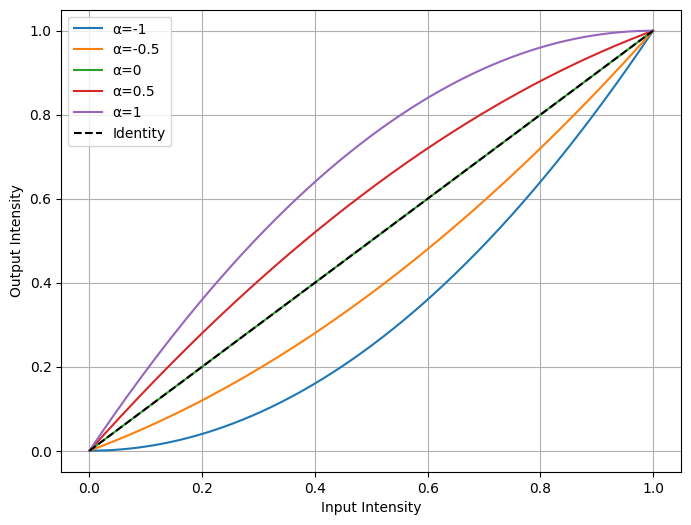

In [66]:
x = np.linspace(0,1,500)

alphas = [-1,-0.5,0,0.5,1]

for a in alphas:
    y = x + a*x*(1-x)
    plt.plot(x,y,label=f"α={a}")

plt.plot(x,x,'k--',label="Identity")

plt.xlabel("Input Intensity")
plt.ylabel("Output Intensity")
plt.legend()
plt.grid()
plt.show()

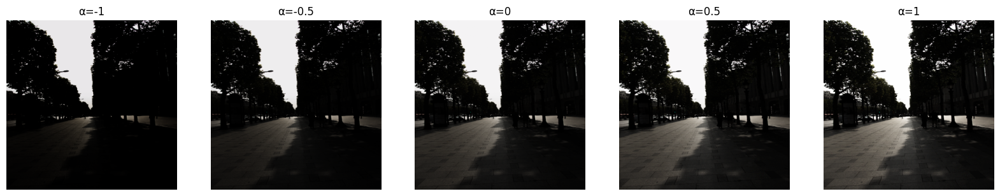

In [67]:
alphas = [-1,-0.5,0,0.5,1]

fig,ax = plt.subplots(1,5,figsize=(20,5))

for i,a in enumerate(alphas):

    out = enhance_curve(img,a)

    out = np.clip(out,0,1)

    ax[i].imshow(out)
    ax[i].set_title(f"α={a}")
    ax[i].axis("off")

plt.show()

In [68]:
x = np.random.rand(100000)

alpha = 1

y = x + alpha*x*(1-x)

print("Minimum:", y.min())
print("Maximum:", y.max())

Minimum: 1.5141311948169124e-06
Maximum: 0.9999999999999564


In [69]:
def mean_brightness(img):
    return img.mean()

alphas = np.linspace(-1,1,11)

for a in alphas:

    out = enhance_curve(img,a)

    print(
        f"alpha={a:.2f}",
        f"brightness={mean_brightness(out):.4f}"
    )

alpha=-1.00 brightness=0.1097
alpha=-0.80 brightness=0.1208
alpha=-0.60 brightness=0.1319
alpha=-0.40 brightness=0.1430
alpha=-0.20 brightness=0.1541
alpha=0.00 brightness=0.1652
alpha=0.20 brightness=0.1763
alpha=0.40 brightness=0.1874
alpha=0.60 brightness=0.1985
alpha=0.80 brightness=0.2096
alpha=1.00 brightness=0.2206


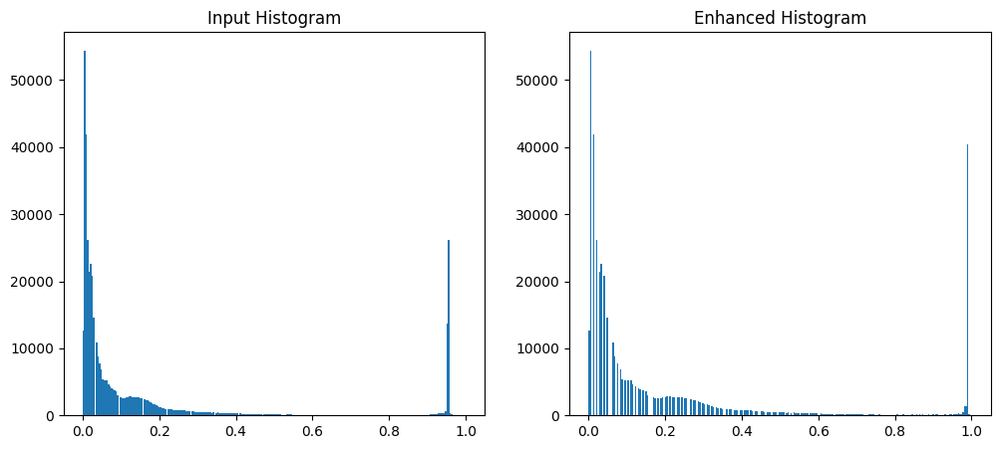

In [70]:
out = enhance_curve(img,0.8)

plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.hist(img.flatten(),256)
plt.title("Input Histogram")

plt.subplot(1,2,2)
plt.hist(out.flatten(),256)
plt.title("Enhanced Histogram")

plt.show()

In [71]:
pixels = np.array([
    0.1,
    0.2,
    0.3,
    0.5,
    0.8
])

alpha = 0.8

enhanced = pixels + alpha*pixels*(1-pixels)

for p,e in zip(pixels,enhanced):

    print(
        f"{p:.2f} -> {e:.2f}"
    )

0.10 -> 0.17
0.20 -> 0.33
0.30 -> 0.47
0.50 -> 0.70
0.80 -> 0.93


In [72]:
from ipywidgets import interact

@interact(alpha=(-1.0,1.0,0.05))
def visualize(alpha):

    out = enhance_curve(img,alpha)

    out = np.clip(out,0,1)

    plt.figure(figsize=(8,8))
    plt.imshow(out)
    plt.title(f"α={alpha:.2f}")
    plt.axis("off")
    plt.show()

interactive(children=(FloatSlider(value=0.0, description='alpha', max=1.0, min=-1.0, step=0.05), Output()), _d…

In [73]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

plt.rcParams["figure.figsize"] = (8,6)

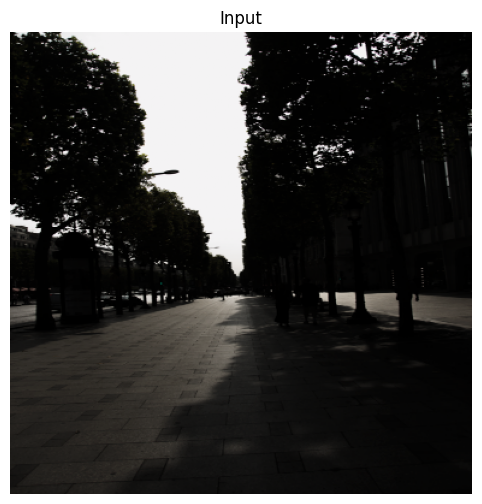

In [74]:
img = cv2.imread("LOL-v2/Train/Low/img42.png")

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img = img.astype(np.float32)/255.0

plt.imshow(img)
plt.axis("off")
plt.title("Input")
plt.show()

In [75]:
def curve(I, alpha):
    return I + alpha*I*(1-I)

In [76]:
def higher_order_curve(image, alpha, n):

    out = image.copy()

    for i in range(n):

        out = curve(out, alpha)

    return out

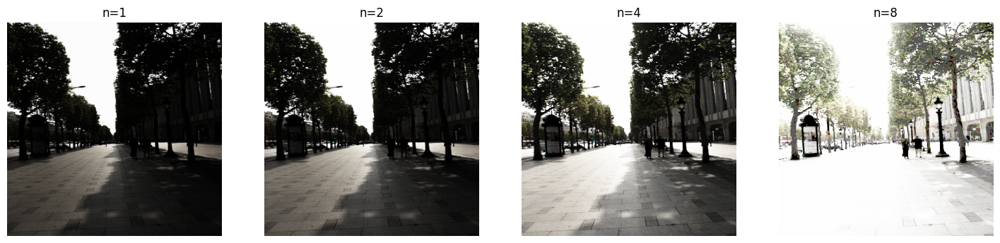

In [77]:
iterations = [1,2,4,8]

fig,ax = plt.subplots(1,4,figsize=(18,5))

for i,n in enumerate(iterations):

    out = higher_order_curve(
        img,
        alpha=0.8,
        n=n
    )

    out = np.clip(out,0,1)

    ax[i].imshow(out)
    ax[i].set_title(f"n={n}")
    ax[i].axis("off")

plt.show()

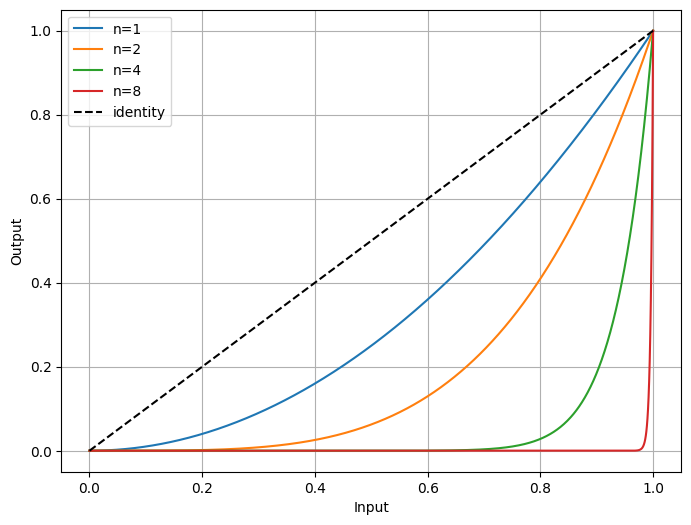

In [78]:
x = np.linspace(0,1,1000)

alpha = -1

for n in [1,2,4,8]:

    y = x.copy()

    for _ in range(n):

        y = y + alpha*y*(1-y)

    plt.plot(x,y,label=f"n={n}")

plt.plot(x,x,'k--',label="identity")

plt.xlabel("Input")
plt.ylabel("Output")
plt.legend()
plt.grid()
plt.show()

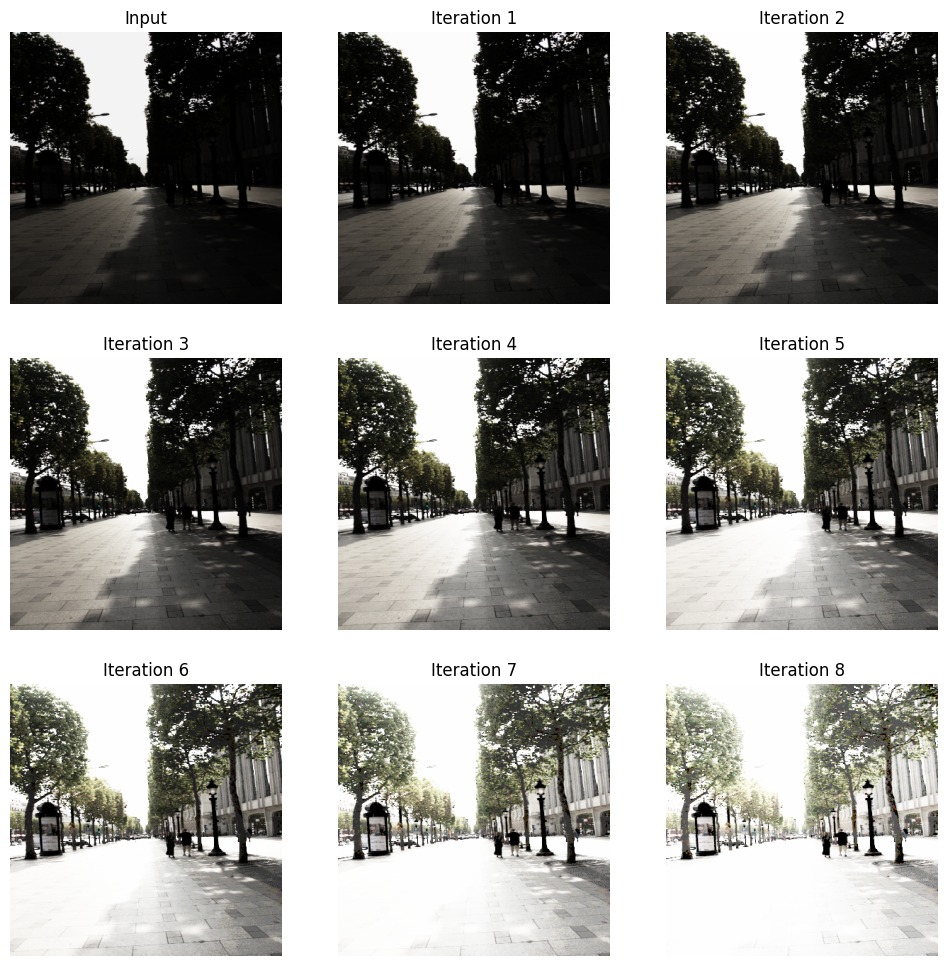

In [79]:
alpha = 0.8

out = img.copy()

fig,ax = plt.subplots(3,3,figsize=(12,12))

ax = ax.flatten()

ax[0].imshow(out)
ax[0].set_title("Input")
ax[0].axis("off")

for i in range(8):

    out = curve(out,alpha)

    ax[i+1].imshow(np.clip(out,0,1))
    ax[i+1].set_title(f"Iteration {i+1}")
    ax[i+1].axis("off")

plt.show()

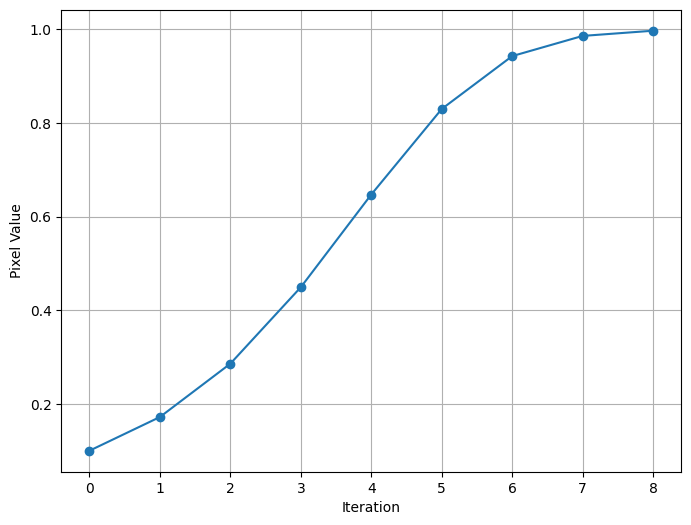

[0.1, 0.17200000000000004, 0.28593280000000004, 0.44927298710732805, 0.6472144032377174, 0.8298767388212076, 0.9428218085689555, 0.985948885253531, 0.9970318299902114]


In [80]:
pixel = 0.10

alpha = 0.8

values = [pixel]

current = pixel

for i in range(8):

    current = current + alpha*current*(1-current)

    values.append(current)

plt.plot(values,'o-')
plt.xlabel("Iteration")
plt.ylabel("Pixel Value")
plt.grid()
plt.show()

print(values)

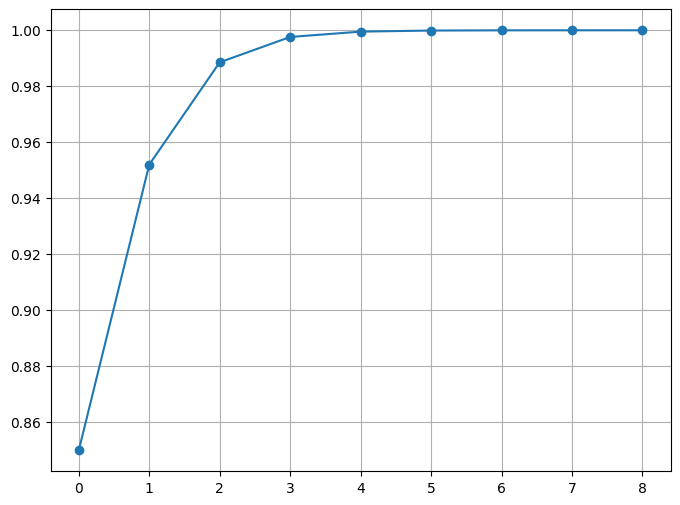

[0.85, 0.952, 0.9885568, 0.997606602539008, 0.9995167378266766, 0.9999031607314728, 0.9999806246440194, 0.9999961246284803, 0.9999992249136812]


In [81]:
pixel = 0.85

alpha = 0.8

values = [pixel]

current = pixel

for i in range(8):

    current = current + alpha*current*(1-current)

    values.append(current)

plt.plot(values,'o-')
plt.grid()
plt.show()

print(values)

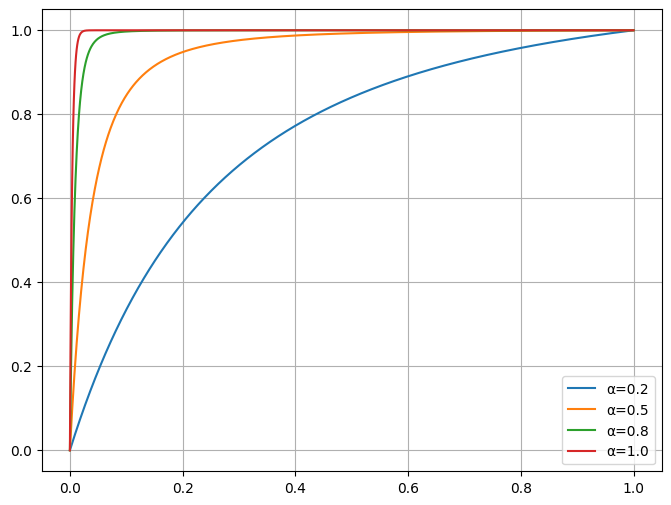

In [82]:
x = np.linspace(0,1,1000)

for alpha in [0.2,0.5,0.8,1.0]:

    y = x.copy()

    for _ in range(8):

        y = curve(y,alpha)

    plt.plot(x,y,label=f"α={alpha}")

plt.legend()
plt.grid()
plt.show()

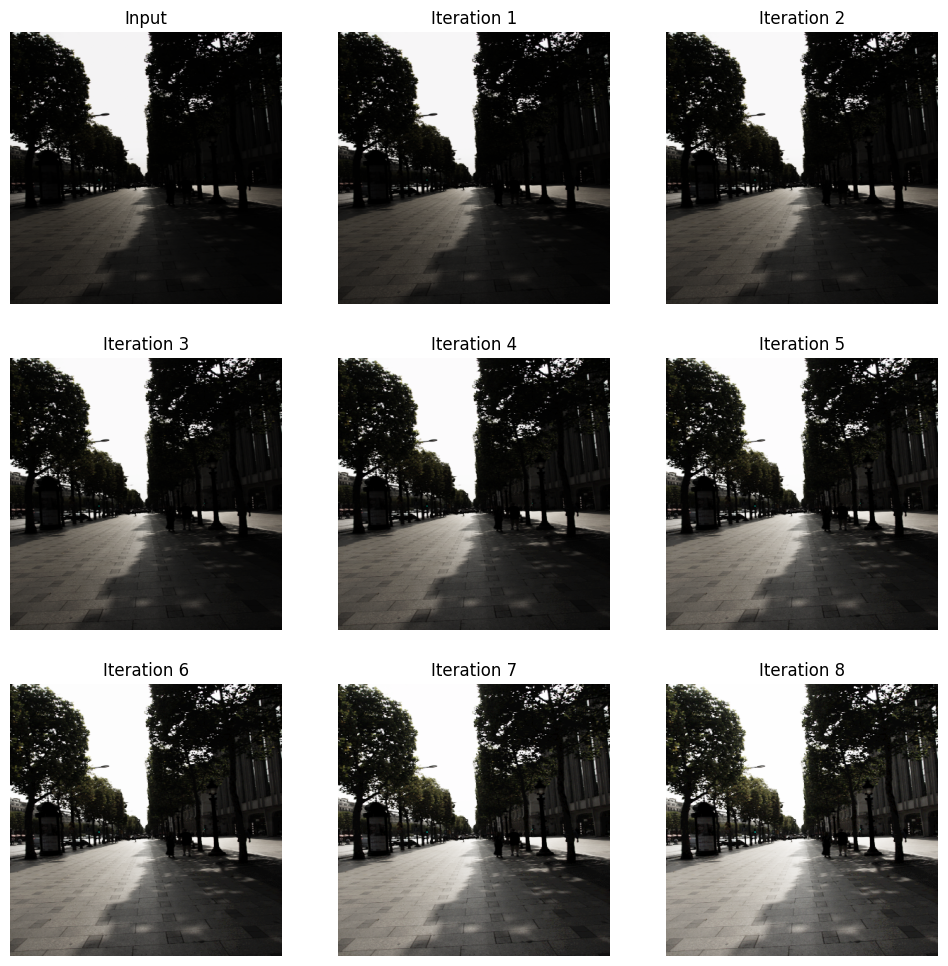

In [83]:
alpha = 0.3

out = img.copy()

fig,ax = plt.subplots(3,3,figsize=(12,12))

ax = ax.flatten()

ax[0].imshow(out)
ax[0].set_title("Input")
ax[0].axis("off")

for i in range(8):

    out = curve(out,alpha)

    ax[i+1].imshow(np.clip(out,0,1))
    ax[i+1].set_title(f"Iteration {i+1}")
    ax[i+1].axis("off")

plt.show()

In [84]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (8,6)

384 384 3


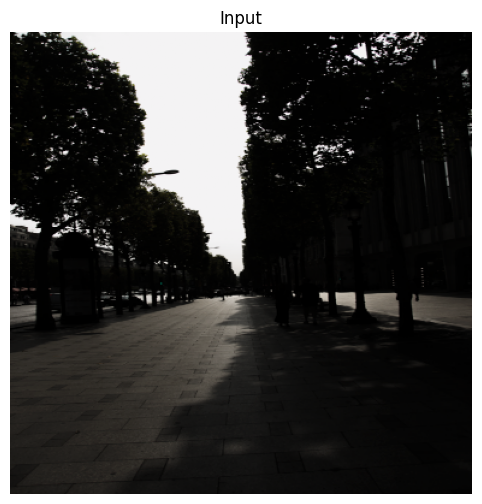

In [85]:
img = cv2.imread("LOL-v2/Train/Low/img42.png")

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img = img.astype(np.float32)/255.0

H,W,C = img.shape

print(H,W,C)

plt.imshow(img)
plt.axis("off")
plt.title("Input")
plt.show()

In [86]:
def curve(I, alpha):
    return I + alpha*I*(1-I)

In [87]:
def pixelwise_curve(I, A):
    return I + A*I*(1-I)

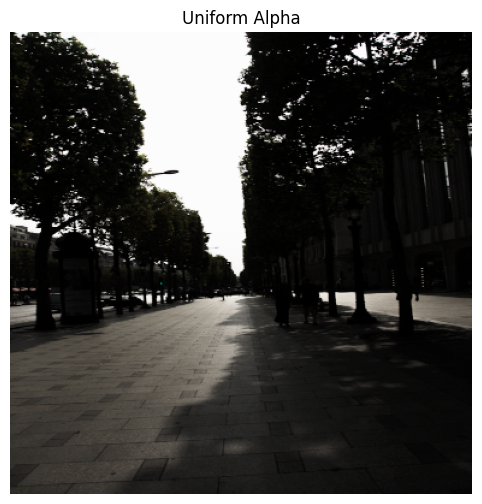

In [88]:
A = np.ones_like(img) * 0.8

out = pixelwise_curve(img,A)

plt.imshow(np.clip(out,0,1))
plt.axis("off")
plt.title("Uniform Alpha")
plt.show()

In [89]:
A = np.zeros((H,W,3),dtype=np.float32)

gradient = np.linspace(1.0,0.0,W)

for c in range(3):
    A[:,:,c] = gradient

print(A.min(),A.max())

0.0 1.0


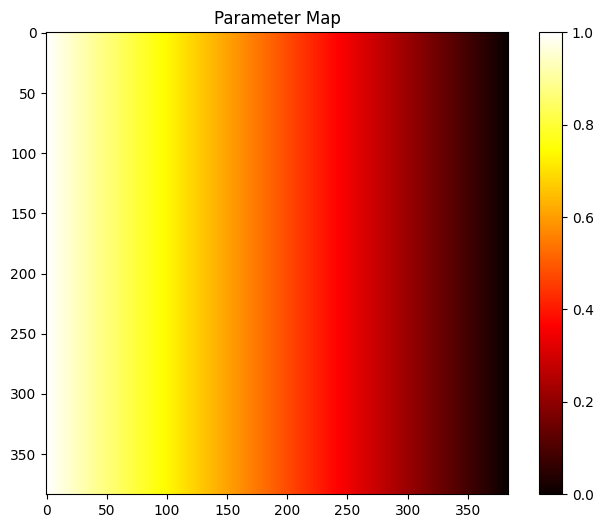

In [90]:
plt.imshow(A[:,:,0],cmap='hot')
plt.colorbar()
plt.title("Parameter Map")
plt.show()

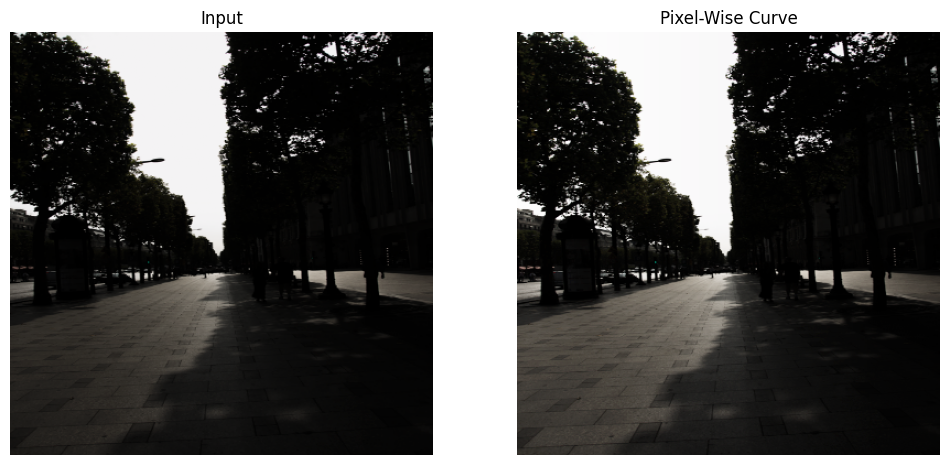

In [91]:
out = pixelwise_curve(img,A)

plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(img)
plt.title("Input")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(np.clip(out,0,1))
plt.title("Pixel-Wise Curve")
plt.axis("off")

plt.show()

In [92]:
gray = img.mean(axis=2)

A_gray = 1.0 - gray

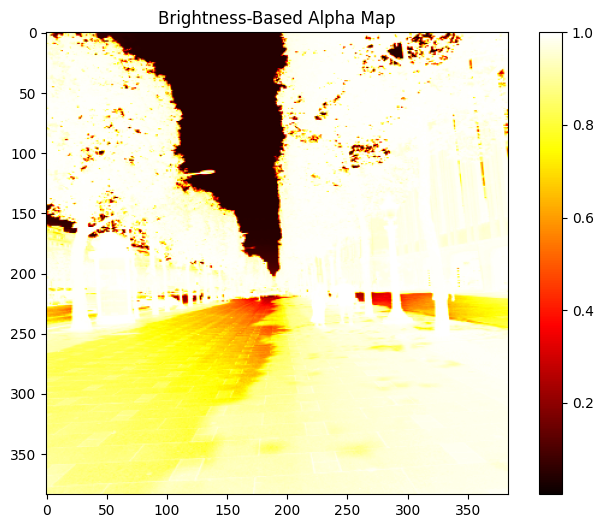

In [93]:
plt.imshow(A_gray,cmap='hot')
plt.colorbar()
plt.title("Brightness-Based Alpha Map")
plt.show()

In [94]:
A = np.stack(
    [A_gray,A_gray,A_gray],
    axis=-1
)

In [95]:
print(A.shape)

(384, 384, 3)


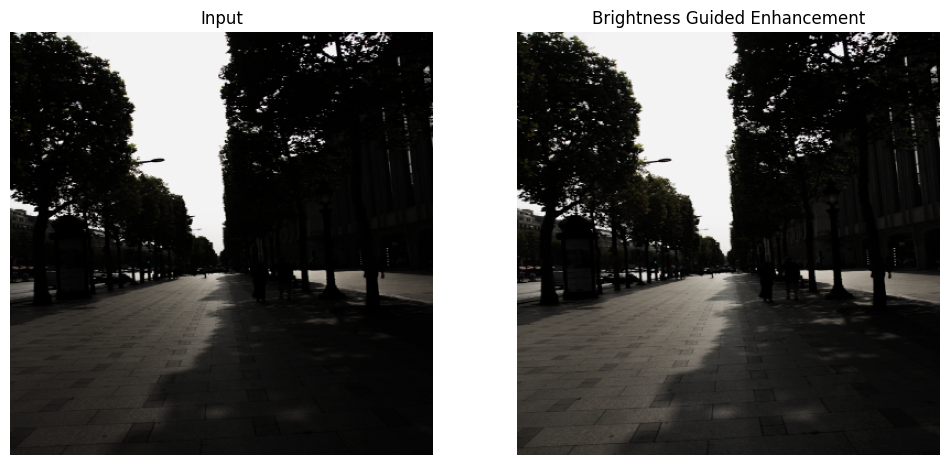

In [96]:
out = pixelwise_curve(img,A)

plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(img)
plt.axis("off")
plt.title("Input")

plt.subplot(1,2,2)
plt.imshow(np.clip(out,0,1))
plt.axis("off")
plt.title("Brightness Guided Enhancement")

plt.show()

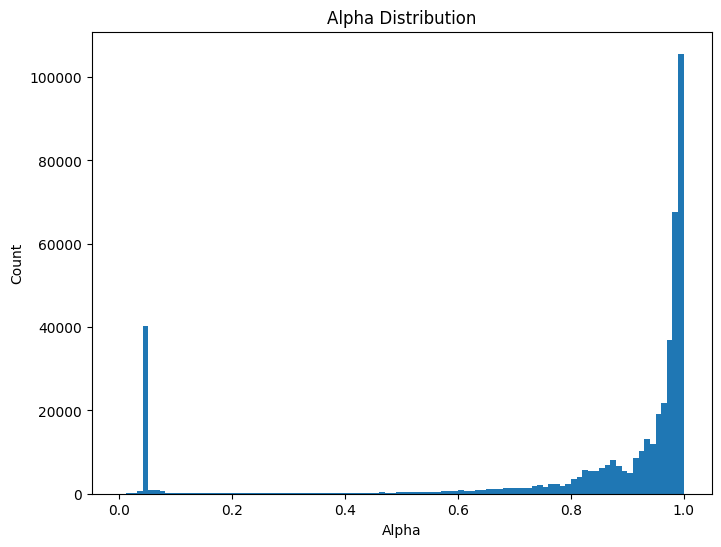

In [97]:
plt.hist(A.flatten(),100)

plt.title("Alpha Distribution")
plt.xlabel("Alpha")
plt.ylabel("Count")

plt.show()

In [98]:
gray = img.mean(axis=2)

A_R = 1.0 - gray
A_G = 0.8*(1.0-gray)
A_B = 0.6*(1.0-gray)

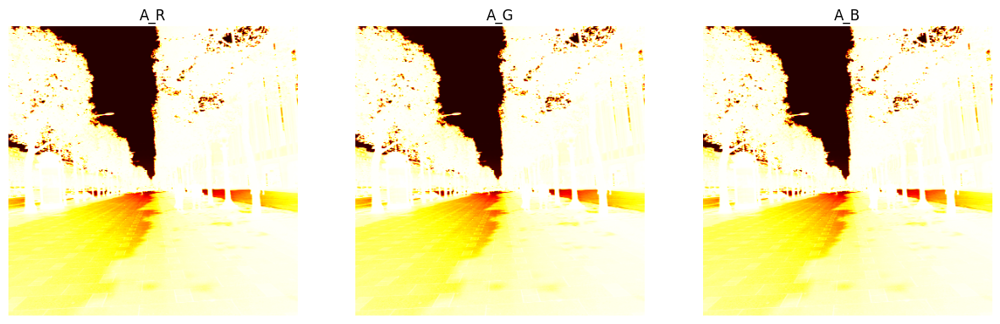

In [99]:
fig,ax = plt.subplots(1,3,figsize=(15,5))

ax[0].imshow(A_R,cmap='hot')
ax[0].set_title("A_R")

ax[1].imshow(A_G,cmap='hot')
ax[1].set_title("A_G")

ax[2].imshow(A_B,cmap='hot')
ax[2].set_title("A_B")

for a in ax:
    a.axis("off")

plt.show()

In [100]:
A = np.stack(
    [A_R,A_G,A_B],
    axis=-1
)

print(A.shape)

(384, 384, 3)


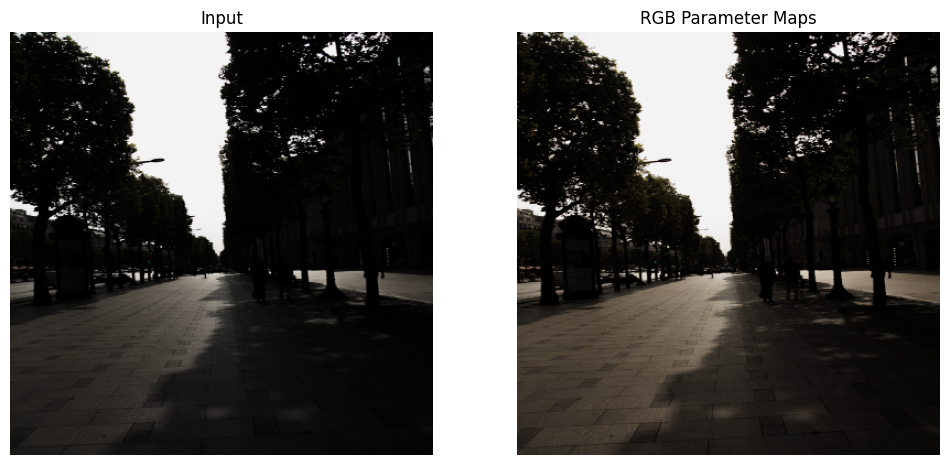

In [101]:
out = pixelwise_curve(img,A)

out = np.clip(out,0,1)

plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(img)
plt.axis("off")
plt.title("Input")

plt.subplot(1,2,2)
plt.imshow(out)
plt.axis("off")
plt.title("RGB Parameter Maps")

plt.show()

In [102]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread("LOL-v2/Train/Low/img42.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = img.astype(np.float32)/255.0

H,W,C = img.shape

gray = img.mean(axis=2)

maps = []

for iteration in range(8):

    strength = 1 - iteration/8

    A_R = strength*(1-gray)
    A_G = 0.8*strength*(1-gray)
    A_B = 0.6*strength*(1-gray)

    maps.append((A_R,A_G,A_B))

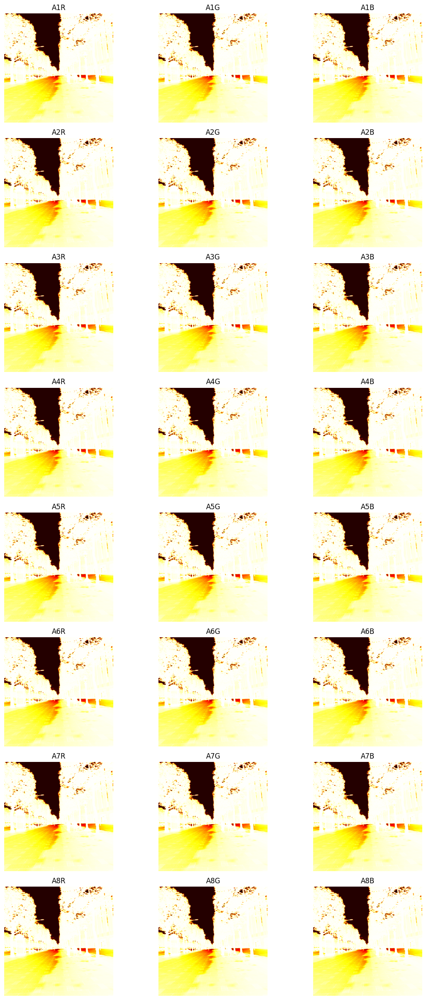

In [103]:
fig,ax = plt.subplots(8,3,figsize=(12,24))

for i,(AR,AG,AB) in enumerate(maps):

    ax[i,0].imshow(AR,cmap='hot')
    ax[i,0].set_title(f"A{i+1}R")

    ax[i,1].imshow(AG,cmap='hot')
    ax[i,1].set_title(f"A{i+1}G")

    ax[i,2].imshow(AB,cmap='hot')
    ax[i,2].set_title(f"A{i+1}B")

    for j in range(3):
        ax[i,j].axis("off")

plt.tight_layout()
plt.show()

In [104]:
A_tensor = np.zeros((H,W,24),dtype=np.float32)

for i,(AR,AG,AB) in enumerate(maps):

    A_tensor[:,:,3*i+0] = AR
    A_tensor[:,:,3*i+1] = AG
    A_tensor[:,:,3*i+2] = AB

print(A_tensor.shape)

(384, 384, 24)


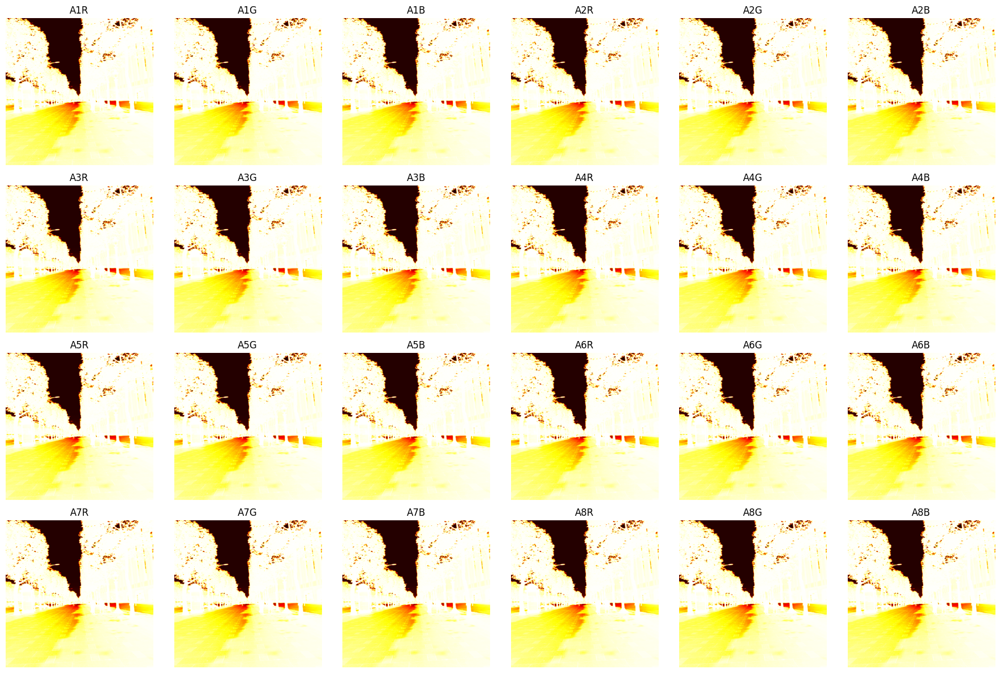

In [105]:
channel_names = []

for i in range(8):
    channel_names.extend([
        f"A{i+1}R",
        f"A{i+1}G",
        f"A{i+1}B"
    ])

fig,ax = plt.subplots(4,6,figsize=(18,12))

ax = ax.flatten()

for i in range(24):

    ax[i].imshow(A_tensor[:,:,i],cmap='hot')
    ax[i].set_title(channel_names[i])
    ax[i].axis("off")

plt.tight_layout()
plt.show()

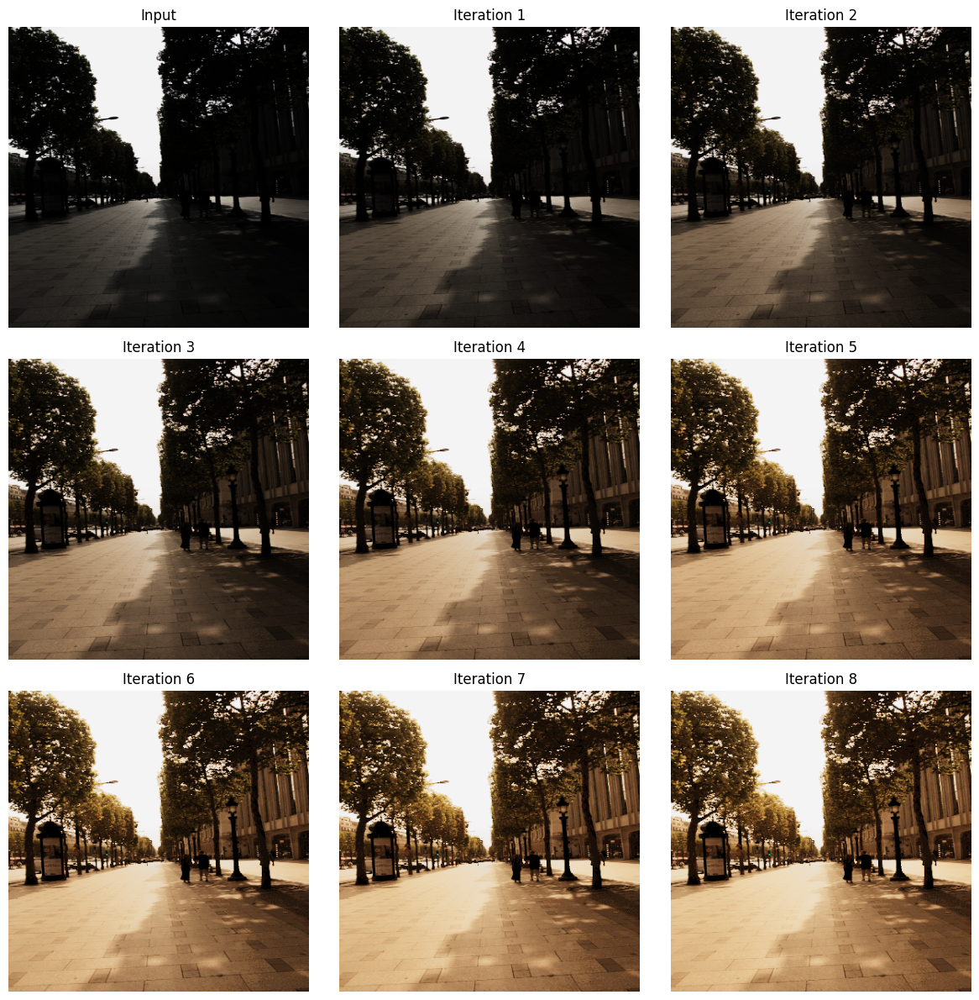

In [106]:
def curve(I,A):
    return I + A*I*(1-I)

out = img.copy()

fig,ax = plt.subplots(3,3,figsize=(12,12))

ax = ax.flatten()

ax[0].imshow(out)
ax[0].set_title("Input")
ax[0].axis("off")

for i in range(8):

    A = np.stack(
        [
            maps[i][0],
            maps[i][1],
            maps[i][2]
        ],
        axis=-1
    )

    out = curve(out,A)

    ax[i+1].imshow(np.clip(out,0,1))
    ax[i+1].set_title(f"Iteration {i+1}")
    ax[i+1].axis("off")

plt.tight_layout()
plt.show()

# DCE-net 

To learn the mapping between an input image and its best-fitting curve parameter maps, we propose a Deep Curve Estimation Network (DCE-Net). 

7 convolutional layers 

each with 32 kernels of size 3x3 

stride =1 

Relu 

last conv layer = Tanh 

8 iteration : 24 maps 

79,416 trainable parameters

5.21G Flops for an input image of size 256×256×3

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F

print(torch.__version__)

2.12.0


In [108]:
x = torch.randn(
    1,
    3,
    256,
    256
)

print(x.shape)

torch.Size([1, 3, 256, 256])


In [109]:
conv = nn.Conv2d(
    in_channels=3,
    out_channels=32,
    kernel_size=3,
    padding=1
)

y = conv(x)

print(y.shape)

torch.Size([1, 32, 256, 256])


In [110]:
class DCENet(nn.Module):

    def __init__(self):

        super().__init__()

        self.conv1 = nn.Conv2d(3,32,3,padding=1)

        self.conv2 = nn.Conv2d(32,32,3,padding=1)

        self.conv3 = nn.Conv2d(32,32,3,padding=1)

        self.conv4 = nn.Conv2d(32,32,3,padding=1)

        self.conv5 = nn.Conv2d(64,32,3,padding=1)

        self.conv6 = nn.Conv2d(64,32,3,padding=1)

        self.conv7 = nn.Conv2d(64,24,3,padding=1)

    def forward(self,x):

        x1 = F.relu(self.conv1(x))

        x2 = F.relu(self.conv2(x1))

        x3 = F.relu(self.conv3(x2))

        x4 = F.relu(self.conv4(x3))

        x5 = F.relu(
            self.conv5(
                torch.cat([x3,x4],1)
            )
        )

        x6 = F.relu(
            self.conv6(
                torch.cat([x2,x5],1)
            )
        )

        out = torch.tanh(
            self.conv7(
                torch.cat([x1,x6],1)
            )
        )

        return out

In [111]:
net = DCENet()

print(net)

DCENet(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv7): Conv2d(64, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)


In [112]:
out = net(x)

print(out.shape)

torch.Size([1, 24, 256, 256])


In [113]:
params = sum(
    p.numel()
    for p in net.parameters()
)

print(params)

79416


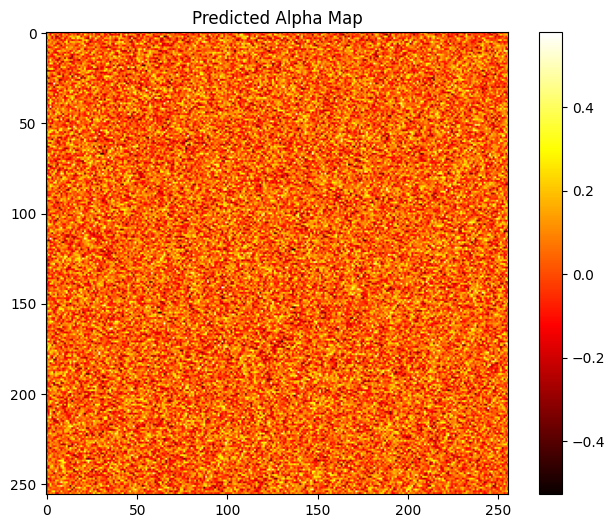

In [114]:
import matplotlib.pyplot as plt

channel = out[0,0].detach().numpy()

plt.imshow(channel,cmap='hot')
plt.colorbar()
plt.title("Predicted Alpha Map")
plt.show()

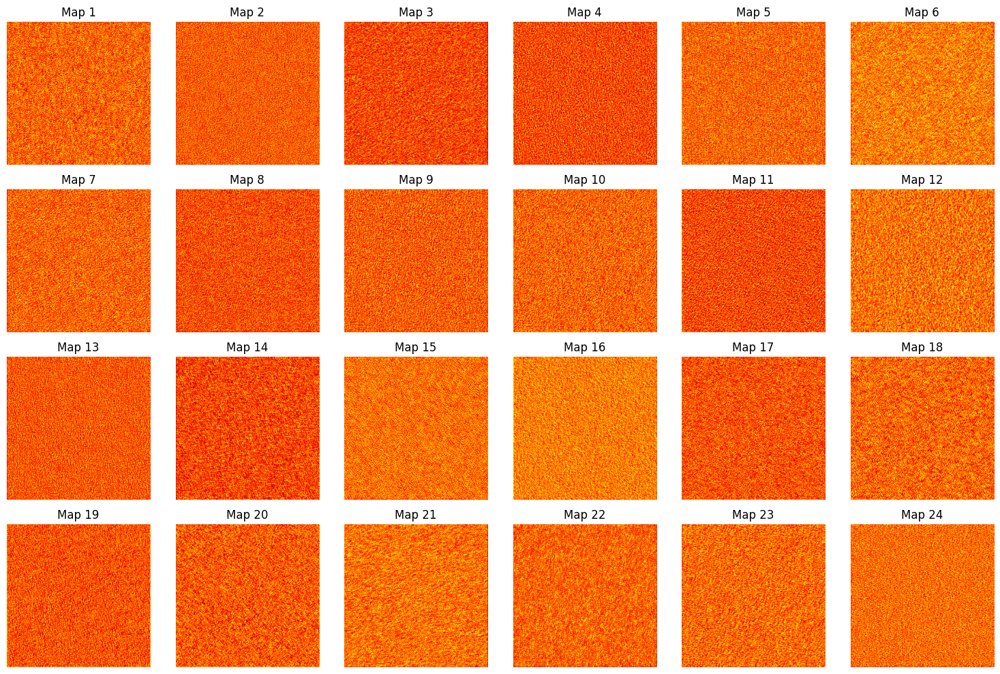

In [115]:
maps = out[0].detach().numpy()

fig,ax = plt.subplots(
    4,
    6,
    figsize=(15,10)
)

ax = ax.flatten()

for i in range(24):

    ax[i].imshow(
        maps[i],
        cmap='hot'
    )

    ax[i].set_title(
        f"Map {i+1}"
    )

    ax[i].axis("off")

plt.tight_layout()
plt.show()

In [116]:
maps = out

for i in range(8):

    A = maps[:,3*i:3*i+3,:,:]

    print(
        f"Iteration {i+1}",
        A.shape
    )

Iteration 1 torch.Size([1, 3, 256, 256])
Iteration 2 torch.Size([1, 3, 256, 256])
Iteration 3 torch.Size([1, 3, 256, 256])
Iteration 4 torch.Size([1, 3, 256, 256])
Iteration 5 torch.Size([1, 3, 256, 256])
Iteration 6 torch.Size([1, 3, 256, 256])
Iteration 7 torch.Size([1, 3, 256, 256])
Iteration 8 torch.Size([1, 3, 256, 256])


In [117]:
def LE_curve(x,A):

    return x + A*x*(1-x)

In [118]:
A1 = out[:,0:3,:,:]

enhanced = LE_curve(x,A1)

print(enhanced.shape)

torch.Size([1, 3, 256, 256])


In [119]:
def enhance(x,maps):

    out = x

    for i in range(8):

        A = maps[:,3*i:3*i+3,:,:]

        out = out + A*out*(1-out)

    return out

In [120]:
maps = net(x)

enhanced = enhance(x,maps)

print(enhanced.shape)

torch.Size([1, 3, 256, 256])
